# <center>Classification</center>

## <font color="green"> Table of Content </font>
- ### [Importing Libraries](#Importing-Libraries)
- ### [Loading Metadata](#Loading-Metadata)
- ### [Creating a Custom Dataset](#Creating-a-Custom-Dataset)
- ### [Plotting Images](#Plotting-Images)
- ### [DataLoader Object](#DataLoader-Object)
- ### [Layers of a Neural Network](#Layers-of-a-Neural-Network)
    - #### [Convolution Layer](#Convolution-Layer)
- ### [Visualizing Convolutional Layers](#Visualizing-Convolutional-Layers)
- ### [Transfer Learning for Multiple Classes](#Transfer-Learning-for-Multiple-Classes)

### <a id="importing-Libraries">Importing Libraries</a>

Before we can work on the task of image classification, we need to work on importing various libraries and packages. Let me explain what these packages do:
- <b> os </b>:For changing directory, creating new directory, listing files, etc.
- <b> torch </b>: The main package for deep learning.
- <b> torch.nn </b>: The neural network module, which contains tools for creating different layers of a neural network.
- <b> pandas </b>: A popular library for working on tabular data.
- <b> tqdm </b>: For visualizing the progress of  loops.
- <b> torchvision.io </b>: For reading images.
- <b> v2 from torchvision.transforms: </b> performing  transformations such as resizing and image augmentation.
- <b>torch.utils. data </b>: Contains important classes and methods for creating custom datasets, dataloader objects for batch processing, and randomly splitting data into train-test groups.
- <b>matplotlib.pyplot </b>: For plotting data and visualization.
- <b> torch.nn.functional </b>: Contains functions for training loss and other neural network operations.
- <b> torch.optim </b> : Contains various optimizers such as ADAM.
- <b> numpy </b> : For numerical computing, primarily on the cpu.
- <b> gc </b>: For garbage collection.  Useful for clearing  memory when needed.

In [1]:
import os
import torch
import torch.nn as nn
import pandas as pd
from tqdm import tqdm
from torchvision import io,models
from torchvision.transforms import v2
from torch.utils.data import Dataset,DataLoader,random_split
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
import random
import gc

In [2]:
torch.manual_seed(0)
torch.cuda.manual_seed(0)
np.random.seed(0)
torch.cuda.manual_seed_all(0)
random.seed(0)

### <a id="Loading-Metadata">Loading Metadata</a>



Let's begin by <b> loading the metadata</b> that we generated previously.  This metadata has information on <b>path </b> to the image, the <b>condition </b> of the image (AD, or no AD), <b> Age </b>, etc.
To load this purpose, we can use the <b>read_csv()</b> method from the pandas library.  Since our data already includes an <b>index</b> column, we specify <b>index_col=0</b> to instruct pandas to use first column as the index.

In [3]:
metadata=pd.read_csv("image_info.csv",index_col=0)

Let's quickly take a look at the first five rows of data by using the <b> head </b> method.

In [4]:
metadata.head()

,Notes,ID,Tag,Sex,Strain,Born,ASP,Location,Sire,Dam,...,ModifiedBy,AgeMo,AgeW,cagesize,Cage,DVC cage code,Plans,Behavior testing code,filename,AgeCateg
0,NaN,925248,29966,F,5XFAD,2023-12-30,475-CMS-2026,BRC-02C705-705-15a-MC-2,GW 29515,GW 29680,...,egdouglass,9.309211,40.428571,NaN,2.0,CROTEAU-07,save for deb,A1,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
1,NaN,925249,29967,F,5XFAD,2023-12-30,475-CMS-2026,BRC-02C705-705-15a-MC-2,GW 29515,GW 29680,...,egdouglass,9.309211,40.428571,NaN,2.0,CROTEAU-08,save for deb,A2,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
2,Needed second ear punch 9/3,925250,29968,F,5XFAD,2023-12-30,475-CMS-2026,BRC-02C705-705-15a-MC-2,GW 29515,GW 29680,...,egdouglass,9.309211,40.428571,NaN,2.0,CROTEAU-09,save for deb,A3,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
4,miniMUGA panel … possible duplication of trans...,925760,29982,F,5XFAD,2024-01-06,475-CMS-2026,BRC-02C705-705-15a-MC-47,GW29511,GW 29685,...,egdouglass,9.078947,39.428571,NaN,47.0,CROTEAU-11,save for deb,D2,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
5,NaN,933588,30037,F,5XFAD,2024-03-27,475-CMS-2026,BRC-02C705-705-15a-MC-34,GW 29969,GW 30008,...,csmith,6.414474,27.857143,NaN,NaN,CROTEAU-14,save for deb,E1,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,B


Let's  look at the <b> columns</b> of the metadata.

In [5]:
metadata.columns

Index(['Notes', 'ID', 'Tag', 'Sex', 'Strain', 'Born', 'ASP', 'Location',
       'Sire', 'Dam', 'Vendor', 'PlateCount', 'MostRecentPlate',
       'GeneTranslation', 'Gene1', 'Gtype', 'Gene2', 'Gtype.1', 'Gene3',
       'Gtype.2', 'Gene4', 'Gtype.3', 'LastAccess', 'ModifiedBy', 'AgeMo',
       'AgeW', 'cagesize', 'Cage', 'DVC cage code', 'Plans',
       'Behavior testing code', 'filename', 'AgeCateg'],
      dtype='object')

How many columns do we have?

In [6]:
len(metadata.columns)

33

In [7]:
print(f"column 2: {metadata.columns[1]}, column 32: {metadata.columns[31]},Column 18: {metadata.columns[17]},column 33: {metadata.columns[32]}")

column 2: ID, column 32: filename,Column 18: Gtype.1,column 33: AgeCateg


Now let's only subset for those columns.

In [8]:
metadata.iloc[:,[1,17,31,32]].head()

,ID,Gtype.1,filename,AgeCateg
0,925248,+,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
1,925249,+,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
2,925250,+,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
4,925760,+,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,A
5,933588,+,/data/banskotan2/Projects/Deep_Learning/5XFAD/...,B


In [9]:
metadata.iloc[0,31]

'/data/banskotan2/Projects/Deep_Learning/5XFAD/SVS_original/64911pi2.2-100224-1-29966-br-abeta.png'

## <a id="Creating-a-Custom-Dataset">Creating a Custom Dataset</a>
Let's create a custom <b> AD Dataset </b>, by subclassing the Dataset object  from <b> torch.utils.data.Dataset </b>.  While it is true that  <b>torchvision </b> provides dataset classes such as <b> ImageFolder </b>, building a custom dataset gives us more control, espcially if we are working with a custom csv file.  </br>
#### Class structure overview:
- The `__init__` method allows us to specify input parameters such as our metadata and any image transforms that we want to apply.</b>
-  The loaded metadata and transform are saved as <b>self.metadata </b> and <b> self.transform </b>, making them available to all other methods in the dataset class.
#### Required methods:
- <b>`__len__`</b>:  Returns the number of samples in the dataset, which is simply the number of rows in the metadata.
- <b>`__getitem__`</b>: Returns a single sample(row) of data. If the provided index  is a tensor (which is possible when working with <b> DataLoader</b>), we conver to integer.

#### Data Extraction Steps:
- <b> Extract image and other columns </b>:  For each sample, we extract the Image Path(index 31),The ID(index 2) and Condition( index 31) from the metadata. Since this is hardcoded, if your metadata changes, you need to update these numbers.
- <b> Convert labels </b> : The Condition column contains "+" (representing AD) and "-" (representing Control).  We map "-" to 0 and "+" to 1 for numerical processing. into numeric variables.
- <b> Read image </b>:- We use <b>torchvision.io.read_io</b>, which returns the image in a format compatible with torch (i.e. <b> channel first</b>, or [C,H,W]).  Other libraries like  <b> PIL </b> and <b> skimage </b> use channel last(i.e. [H,W,C]), so you may need to transpose axes if you use them, especially when plotting with matplotlib.
- <b> Apply transforms </b>:  If any  transforms were specified (for example by using <b>transforms.Compose</b>), we apply them here. If we use <b>toTensor()</b>, pixel values will be scaled from 0 to 1. We manually divided by 255.0 to scale the images.
- <b> Return a Dictionary </b>:  Each sample is represented as a dictionary with keys "image", "id", "Condition" and "Age_Categ", which makes downstream processing convenient.

In [10]:
class AD_Dataset(Dataset):
    def __init__(self,csv_file,transform=None):
        self.metadata=pd.read_csv(csv_file,index_col=0)
        self.transform=transform
    def __len__(self):
        return len(self.metadata)
    def __getitem__(self,idx):
        if torch.is_tensor(idx):
            idx=idx.tolist()
        image_name=self.metadata.iloc[idx,31]
        #print(image_name)
        ID_name=self.metadata.iloc[idx,1]
        Condition_name=self.metadata.iloc[idx,17]
        Condition_int=0 if Condition_name=="-" else 1
        Age_Categ_name=self.metadata.iloc[idx,32]
        image_dat=io.read_image(image_name)
        image_dat=image_dat.type(torch.float32)/255.0
        #print("Pre-Normalize stats: min", image_dat.min().item(), "max", image_dat.max().item(), "mean", image_dat.mean().item())
        if self.transform:
            image_dat= self.transform(image_dat)
            #print("Post-Normalize stats: min", image_dat.min().item(), "max", image_dat.max().item(), "mean", image_dat.mean().item())

        sample={"image":image_dat,
                "id":ID_name,
                "Condition":torch.tensor(Condition_int,dtype=torch.long),
               "Age_Categ":Age_Categ_name}
        return sample

Here is how we create the dataset. We pass the metadata CSV file as an argument.  Since transform is not specified, no image transforms will be applied. If you want to specify a transform, use the transform argument.  In this case, the dataset will be used for plotting images.

In [11]:
ad_data=AD_Dataset("image_info.csv")

Let's look at the shape of the first image.

In [12]:
#print(ad_data[0]["image"][0:1,10:20,50:80])
print(ad_data[0]["image"].shape)

torch.Size([3, 4095, 6872])


Now let's compose a transformation pipeline.  All images must have the same dimension to be used as input for a neural network. For this, we will resize our images tso that the  shorter dimension is 256 pixels.  The longer dimension will be scaled proportionally to maintain the aspect ratio (i.e. ratio between height and width).  
We will then crop a centered 224x224 image from the resized image. For example, the first image in the dataset has dimensions of 3x4095x6872, which is too large for typical deep learning models.  
The <b>torchvision v2 </b> module provides numerous transformations that can be used with <b> v2.compose</b>,including: 
- <b> Resize</b>: Changes the dimension of the image. The shorter side is scaled to 256. The longer side is also scaled, but is not 256, unless your image originally is a square image.
- <b> CenterCrop or RandomCrop</b>: Crops the image at the center or at a random location. One strategy is to resize to a higher dimension (e.g. 256x256) and then crop a centered patch of the desired size (224x224). 
- <b> Normalize </b> Subtract the mean and divide by the standard deviation.  This helps the neural network train more efficiently. These numbers are typically from ImageNet, which have been  used to pretrain models such ResNet or VGG.

There are many more transformations available.  Please check the torchvision transformations documentation below<br>
https://docs.pytorch.org/vision/main/auto_examples/transforms/plot_transforms_getting_started.html

In [13]:
transformation=v2.Compose([
    v2.Resize(256),
    v2.CenterCrop(224),
    v2.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

We now also create a custom dataset using this transformation.  This will be fed to the neural network.

In [14]:
ad_data_transformed=AD_Dataset("image_info.csv",transform=transformation)
#ad_data_transformed=ad_data

In [15]:
#ad_data_transformed[0]

Let's compare the original dimension to the new dimension.

In [16]:
original_shape=ad_data[0]['image'].shape
transformed_shape=ad_data_transformed[0]['image'].shape
print(f"Original:{original_shape}, Transformed: {transformed_shape}")

Original:torch.Size([3, 4095, 6872]), Transformed: torch.Size([3, 224, 224])


What is the datatype of the image?  

In [17]:
original_type=ad_data[0]['image'].dtype
print(f"Original:{original_type}")

Original:torch.float32


Note that some programs such as PIL may return int as oppose to float.

In [18]:
len(ad_data)

25

### <a id="Plotting-Images">Plotting Images</a>

##### Function Description

This function visualizes a batch of image data in a grid of subplots:
- By default, it creates a grid of 5x5 subplots(rowsxcolumns) allowing up to 25 images per figure.
- Initial indices(j for row and k for column) are set to 0
- The figure and axes are created using plt.subplots, specifying l rows and w columns with a figure size of 18x10
- The function loops through each sample in the provided data.
- For each image:
    -  It normalizes the range to be between 0 to 1 for consistent visualization
    -  It rearranges the tensors from [C,H,W] to [H,W,C] as required by matplotlib.
    -  It displays the image in a corresponding subplot
    -  It sets a title for each subplot, showing AD and Control. For additional context, it also adds the Age Category.

In [19]:
def run_image(data,l=5,w=5,sz=(18,10),dpi=200):
    total_images=len(data)
    fig,ax=plt.subplots(l,w,figsize=sz,dpi=dpi)
    for i,sample in enumerate(data):
        #print(i)
        if i>=l*w:
            break
        row=i//w
        col=i%w
        #print(image.shape)
        image=sample["image"].clone()
        image = (image-image.min()) / (image.max()-image.min() + 1e-6)
        image = image.permute(1, 2, 0).cpu().numpy()
        ax[row,col].imshow(image)
        cond="AD" if sample["Condition"]==1 else "Control"
        title_for_plot=cond+"("+sample["Age_Categ"]+")"
        ax[row,col].set_title(title_for_plot)
    for i in range(total_images,l*w):
        row=i//w
        col=i%w
        ax[row,col].axis("off")
    plt.tight_layout()
    plt.show()

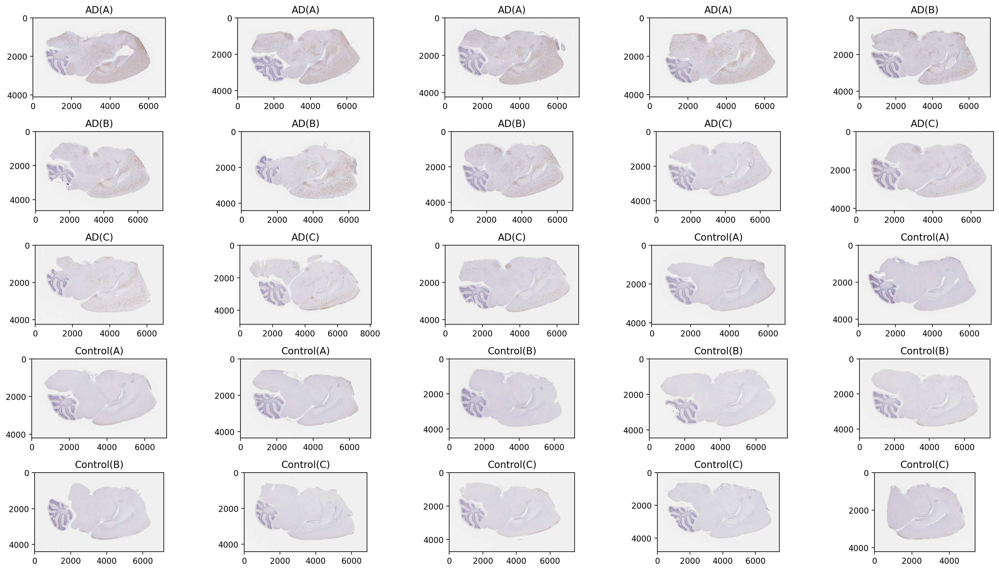

In [20]:
run_image(ad_data,l=5,w=5)

Let's split our dataset into 2 groups: the <b>training set</b> and the <b>test set</b>.  
For reproducibility we set the <b>seed</b> to zero.  
This setup is crucial to ensure that our data can generalize to unseen data and prevent <b>overfitting</b>, where the data badly performs on new examples.
In practice, it is customary to divde the data into three sets:
- The <b>training set</b> for fitting the model
- The <b>development</b> set or the validation set for tuning the hyperparameters.
- The <b>test set</b>, which is used for final evaluation.  How well does it perform on real-world examples.

For this example, our dataset is split into:
- 17 samples for training
- 8 samples for testing

In [21]:
generator = torch.Generator().manual_seed(42)
train_data,test_data=random_split(ad_data_transformed,lengths=[17,8],generator=generator)

Let's print the size of the training and test sets.

In [22]:
print(f"Train Data: {len(train_data)},Test Data: {len(test_data)}")

Train Data: 17,Test Data: 8


### <a id="DataLoader-Object">DataLoader Object</a>

The next step is to create a <b>DataLoader</b> object. 
We will create three DataLoader instances: one for the training set, one for the test set, and another for the full dataset.

The DataLoader efficiently divides the dataset into smaller sizes called <b>batches</b>, which are passed to the model during training and evaluation. This is essential to do because it allows us to process datasets that are too large to fit into memory at once.  
Additionally,the DataLoader can <b> shuffle </b> the dataset, to help the dataset generalize better. The model is presented with a different dataset every iteration.

Common batch sizes are 32,64, 128, but the number of samples to process per batch depends on the GPU used, as well as sample size.  Since our sample size is quite small, we are using just 8 samples per batch.

In [23]:
full_data=DataLoader(ad_data_transformed,batch_size=8,shuffle=True)
training_dataload=DataLoader(train_data,batch_size=8,shuffle=True)
test_dataload=DataLoader(test_data,batch_size=8,shuffle=True)

### <a id="Layers-of-a-Neural-Network">Layers of a Neural Network</a>

<b>Convolution Layer</b>

A convolution layer is one of the <b>fundamental building blocks</b> of a Convolutional Neural Network (CNN). Basically, a CNN extracts important features from your image by scanning it with <b>learnable filters</b> called <b>kernels</b>.

The figure below from IBM illustrates this process.  
At each location,  the CNN layer takes a patch of pixels  from the input (for example, a 3x3 or 5x5 region) and performs an operation called <b>convolution</b>.
- The <b>filter</b>, which is a set of learnable weights, is placed over the patch.
- Each element in the image patch is <b>multiplied</b> by the corresponding weight in the kernel. This is an element-wise multiplication.
- The results are <b>summed</b> to produce a single value, which is basically a new "pixel" in the output.
- The kernel is moved across the image according to a parameter called <b>stride</b> (e.g. stride of 1 moves it to the right by one).

The convolution weights are randomly initialized. As the network trains via <b>gradient descent</b>, the weights learn to detect different textures, shapes and edges.<br>  
<img src="https://www.ibm.com/content/dam/connectedassets-adobe-cms/worldwide-content/creative-assets/s-migr/ul/g/ed/92/iclh-diagram-convolutional-neural-networks.png"></img>

In the figure above, the image is 5 pixels wide and the kernel is 3 pixels wide.  Although the image is 2D, we are considering a single dimension for simplicity. If you move the kernel by 1, you can only move it 3 times before it "hangs off".  This results in the output being smaller than the input (for example, in this example, the output will be 3 pixels wide instead of 5). This reduction in a CNN is <b> normal </b> unless padding is applied. This is typically achieved by adding zeros around the border of the image, a technique called <b> same padding </b>. For example, with a 3×3 kernel and stride 1, adding a column of zeros to each side of the image allows the kernel to fit and slide across every original pixel position, preserving the input dimensions in the output.  When stride is 1 and we perform no padding, the simple formula to estimate the size of the output is:
$$\text{Output Size}=\text{Input Size} − \text{Kernel Size}+1$$


Source of the image:https://www.ibm.com/content/dam/connectedassets-adobe-cms/worldwide-content/creative-assets/s-migr/ul/g/ed/92/iclh-diagram-convolutional-neural-networks.png


<b>Max Pooling Layer</b><br>
Max pooling is a method, typically used in a CNN, where you take a small patch of feature map (such as 2x2 or 3x3 region) and output only the <b>maximum value</b> from that patch. This results in a smaller feature map. Max pooling helps reduce overfitting and computational cost by shrinking the spatial size of feature maps.<br>
The image below shows how max pooling works.

<img src="https://nico-curti.github.io/NumPyNet/NumPyNet/images/maxpool.gif"></img>

Source: https://nico-curti.github.io/NumPyNet/NumPyNet/images/maxpool.gif

<b> Batch Normalization </b></br>
Batch normalization is a method in deep learning that makes training more stable and faster. For each mini batch, batch normalization normalizes feature maps, so that they have a mean of zero and a standard deviation of 1.  
This normalized data is then transformed further by using learnable parameters called $\beta$ and $\gamma$. These are per-channel parameters.  While $\beta$ controls shifting (i.e. added to the normalize d input), $\gamma$ controls scaling (i.e. multiplied with the normalized input).

<b>Activation Functions</b><br>
The ReLU activation works by converting all negative values to zero, while keeping the positive values unchanged.  It is given by the formula:<br>
<b>$$ReLU(x)=\max(0,x)$$ </b>
ReLU is a widely used activation function that introduces non-linearity and helps reduce the vanishing gradient problem.  <br>
<br>
The <b>Sigmoid</b> activation maps input values to a range between 0 and 1.  It is commonly used in binary classification tasks.  The mathematical formula is:<br>
$$\sigma(x)=\frac{1}{1+e^{-x}}$$ <br>
<br>
The <b>Softmax</b> activation  is typically used in the output layer of neural networks for <b>multi-class classification</b> problems. It converts a vector of raw scores (logits) into probabilities that sum to 1. In PyTorch, the <code>CrossEntropyLoss</code> function combines both softmax and negative log-likelihood in one step, so you don't need to apply softmax explicitly when using it—even for binary classification. The softmax formula is given by:

$$\text{Softmax}(x_i) = \frac{e^{x_i}}{\sum_j e^{x_j}} $$

<b> Fully Connected Layer </b>
A fully connected layer, or dense layer, is a fundamental component of a traditional neural network.  In a traditional neural network, every input neuron is connected to every output neuron via a unique weight.  This allows the neural network to learn complex features and intricate patterns.  
However, as all input and output nodes are connected, this can lead to a very large number of parameters.  This will also lead to issues such as overfitting.  An example of a fully connected neural network is shown below:
<img src = "https://www.ibm.com/content/dam/connectedassets-adobe-cms/worldwide-content/cdp/cf/ul/g/3a/b8/ICLH_Diagram_Batch_01_03-DeepNeuralNetwork.png"></img>

Source:https://www.ibm.com/content/dam/connectedassets-adobe-cms/worldwide-content/cdp/cf/ul/g/3a/b8/ICLH_Diagram_Batch_01_03-DeepNeuralNetwork.png

<b> Dropouts for regularization </b></br>
Neural networks can be prone to overfitting, especially if they have many parameters and are very deep.  Dropout is a regularization technique that prevents overfitting by randomly deactivating some neurons (setting this output to zero) during training. </br>
At test time, dropout is disabled, and all neurons used.

In addition to dropout, there are other regularization techniques such as <b>L1 </b> and <b>L2</b> regularization.  These methods work by adding a penalty to the loss function based on the size of the weights.

<b> Our CNN architecture </b><br>
We start with our input layer of a standard 224x224 RGB image with 3 channels. <br>
<b> First Convolution Block </b>
- A convolution layer increases the number of channels to 64, with a kernel size of 5,  stride of 1 and no padding, reducing the dimension from 224 to 220 (224-5+1).
- Batch Normalization is applied to  the output activations to stabilize training and alleviate issues like vanishing gradient. 
- The output then passes through a ReLU activation function.
- A max pooling layer with stride of 2 and size of 2 reduces the spatial dimension to 110x110x64

<b> Second Convolution Block </b><br>

- Another convolution layer with the same settings increases the number of channels to 128. The output size is reduced to 110-5+1=106, and after pooling to 53x53x128.
<b> Third Convolution Block </b> <br>
- We use  the same settings, while increasing the number of channels to 256.  The output size is further reduced to 53-5+1=49 after convolution, and to 24x24x256 after pooling.
<b> Fourth Convolution Block </b> <br>
 - We increase the number of channels to 512, reducing the dimension to 20 after convolution, and 10x10x512 after max pooling.
<b> Fully connected layer after flattning </b>
- The feature map is flattened to a vector of size 512x10x10 or vector of size 512,000.
- This vector is passed to a fully connected (FC) layer with 30 outputs, and dropout regularization applied.
- Another fully connected layer reduces the size to 10 outputs.
- Finally, this layer is connected to 2 outputs for binary classification (using either sigmoid or softmax).


<img src="CNN_layer.png"></png>

The `nn.Module` class (which was explained in the previous lecture) is the  base class for all neural networks in PyTorch. To build a custom neural network, you create a subclass of `nn.Module` and define two main methods. These are:
1) <b>`__init__(self)`</b>: <br>
This is where we define the layers of our neural network.  Common layers and functions include:
   - <b>`super().__init__()`</b>: This method initializes the parent nn.Module. Required to set up the module.
   - <b> `nn.Conv2d(in_channels,out_channels,kernel size)`</b>: Adds a convolutional layer. We specify the input channels (typically 3 for an RGB image), the output channels (number of filters), and the kernel size.
   - <b> `nn.MaxPool2d(kernel_size, stride)`</b>: Downsamples the feature maps based on a kernel size and number of strides.
   - <b> `nn.BatchNorm2d(num_features)`</b>: Performs batch normalization on a mini-batch.
   - <b> `nn.Linear(in_features,out_features)`</b>: A fully connected (dense) layer. Transforms in_features to out_features.
   - <b> `nn.Dropout(p)`</b>: Randomly sets a fraction p of input units to zero during training for regularization.
2) <b> `forward()`</b>: <br> This method defines how data passes through the network.  For example:<br><br>
   <b>       <center>`x=self.pool(F.relu(self.bn1(self.conv1(x))))`</b></center> <br> performs a convolution operation, followed by batch normalization, ReLU activation, and maxpooling.

In [24]:
class custom_model(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1=nn.Conv2d(3,64,5)
        self.bn1=nn.BatchNorm2d(64)
        self.pool=nn.MaxPool2d(2,2)
        
        self.conv2=nn.Conv2d(64,128,5)
        self.bn2=nn.BatchNorm2d(128)
        
        self.conv3=nn.Conv2d(128,256,5)
        self.bn3=nn.BatchNorm2d(256)
        
        self.conv4=nn.Conv2d(256,512,5)
        self.bn4=nn.BatchNorm2d(512)
        
        self.fc1=nn.Linear(512*10*10,30)
        self.fc2=nn.Linear(30,10)
        self.fc3=nn.Linear(10,1)
        
        self.dropout=nn.Dropout(p=0.3)
    def forward(self,x):
        x=self.pool(F.relu(self.bn1(self.conv1(x))))
        x=self.pool(F.relu(self.bn2(self.conv2(x))))
        x=self.pool(F.relu(self.bn3(self.conv3(x))))
        x=self.pool(F.relu(self.bn4(self.conv4(x))))
        x=torch.flatten(x,1)
        x=self.dropout(F.relu(self.fc1(x)))
        x=F.relu(self.fc2(x))
        x=self.fc3(x)
        return x

We next instantiate our custom model and assign it to the variable `model`.  To leverage faster computation, we move the model to the GPU (in this case I have used V100X) using `.to("cuda")`. <br>
Since our task is binary classification (i.e. distinguishing between two classes), we will use  <b> Binary Cross Entropy with Logits Loss</b>.  This loss automatically combines the Sigmoid activation function with the binary cross entropy calculation, which is why you do not need to add a separate sigmoid layer to your model's output.  <br>
PyTorch provides various loss functions including:
- <b>`BCELoss()`</b>: Binary Cross Entropy loss for binary classification. You must manually  apply a <b> sigmoid </b> activation before applying this loss.
- <b>`BCEWithLogitsLoss()`</b>: Similar to <b>BCELoss()</b>, but it internally applies <b>sigmoid</b> activation to the final output, making it numerically stable.
- <b>`CrossEntropyLoss()`</b>:  Used for <b>multi-class classification</b> tasks. Takes raw logits as input and applies softmax internally.
- <b>`MSELoss()`</b>: Mean Squared Error Loss, commonly used for <b>regression</b> tasks (e.g. predicting age of mice in weeks).
There are many more available on the website. Please go to:
https://docs.pytorch.org/docs/stable/nn.html#loss-functions
<br>
<br>
Next, we select an <b>optimizer</b>, which determines how our model's parameters are optimized during training.  Here, we use the <b>Adam </b> optimizer, which incorporates <b> momentum </b> and <b> Adaptive Learning rates </b> for faster convergence. We also specify a learning rate of 1e-3 and <b> weight decay of 1e-5</b>, which is a regularization method to prevent overfitting for larger weights. The learning scheduler adjusts the learning rate.  The "min" option tells the scheduler to  monitor the loss function that you want to minimize.  A patience value of 5 means the learning rate is adjusted if the validation loss does not improve after 5 epochs, while a factor of 0.5 halves the learning rate.
PyTorch provides various optimizers such as:
- <b>` SGD()` </b>: <b>Stochastic gradient descent</b> which updates parameters for each mini-batch
- <b>`RMSProp()` </b>: Applies <b>momentum</b> and <b>Adaptive Learning Rates </b>, similar to the Adam optimizer
- <b>`SGD with momentum`</b>: Can be applied by setting the <b>momentum </b> parameter in SGD().  Research indicates that it may work well for certain tasks such as visualization.
- <b>`Adam()`</b>: Explained above
- <b>`AdamW()`</b>: A variant of <b> Adam </b> where weight decay is updated separately.

For more about various optimizers, please visit:
https://docs.pytorch.org/docs/stable/nn.html#loss-functions

In [25]:
torch.manual_seed(1)
device="cuda" if torch.cuda.is_available() else "cpu"
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(1)
model=custom_model()
model=model.to(device)
criterion = nn.BCEWithLogitsLoss()
learning_rate=1e-3
weight_decay=1e-5
optimizer = optim.Adam(model.parameters(), lr=1e-3,weight_decay=weight_decay)
scheduler=torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, "min",patience=5,factor=0.5)

Using the <b>print</b>, we are also able to check the layers of our neural network.

In [26]:
print(model)

custom_model(
  (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1))
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(256, 512, kernel_size=(5, 5), stride=(1, 1))
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=51200, out_features=30, bias=True)
  (fc2): Linear(in_features=30, out_features=10, bias=True)
  (fc3): Linear(in_features=10, out_features=1, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
)


Now that we have created our custom model  using `torch.nn`, and specified loss functions and optimizer, we are ready to <b>train</b> the model.  
<b> Data Splitting </b>
- Typically, you may want to split the data into three parts (mainly <b>training</b>, <b>validation</b> and <b>test</b> sets)
- For simplicity, we will use 2 dataloaders (train and test)<br>

<b> Monitor Performance </b>
- <b>Record</b> the  loss for both the training and test datasets.
-  <b>Track</b> test set predictions to calculate accuracy.
<b> Epochs </b>
- The <b>number of epochs</b> determines the number of times we loop through the dataset.
- In this case, we use <b>80 epochs</b>. <br><br>
<b> Training mode</b>
- Setting the model to  training mode with `model.train()` to use <b>regularization</b> such as <b>dropouts</b>.
- For each batch in the training dataloader:
      - Move the images and labels to the <b>GPU</b> using `to(device)`
      - Convert to floats and reshape as needed using `view(-1,1)` to ensure correct dimension.<br>
<b> Optimization steps </b>
- Use `optimizer.zero_grad()` to reset  gradients before each <b>optimizer step</b>, preventing accumulation of gradients.
- Perform a <b>forward pass</b> using `model(images)`,
- Compare resulting output using the <b>loss</b> function(`criterion`). <br>
- <b>Backpropagation </b> the loss with `backward()` to compute gradients.
- <b> Update </b> Model parameters using `optimizer.step()`
- <b> Accumulate</b> running loss and calculate the average loss after each epoch.

<b>Evaluation Mode</b> 
- Switch to evaluation mode using `model.eval()`, which <b>disables</b> dropout and other regularization techniques.
- Wrap the model in  `with torch.no_grad()` to avoid computing gradients and save memory.
- The <b>evaluation loop</b> mirrors the training loop
- Use the <b>scheduler</b> to adjust the learning rate if test loss shows no improvement.
- Compute  the test loss and prediction accuracy for <b>reporting</b>.
<b>Progress monitoring</b>
- `tqdm` provides a <b>progress bar</b>.
- Use <b>print()</b> statement to show epoch statistics.

In [27]:
loss_list=[]
loss_list_test=[]
prediction_test=[]
for epoch in tqdm(range(80)):  # loop over the dataset multiple times
    model.train()
    running_loss = 0.0
    total_samples=0
    for batch in training_dataload:
        # get the inputs; data is a list of [inputs, labels]
        images=batch["image"].to(device)
        #print(images)
        #print(images)
        labels=batch["Condition"].float().to(device).view(-1,1)
        #print(labels)
        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()*images.size(0)
        total_samples+=images.size(0)
    epoch_loss=running_loss/total_samples
    loss_list.append(epoch_loss)
    model.eval()
    pred_list=[]
    actual_list=[]
    with torch.no_grad():
        test_running_loss=0.0
        total_samples_test=0
        for batch_test in test_dataload:
            images_test=batch_test["image"].to(device)
            labels_test=batch_test["Condition"].float().to(device).view(-1,1)
            outputs_test=model(images_test)
            preds=outputs_test
            pred_list.extend(preds.cpu().tolist())
            actual_list.extend(labels_test.cpu().tolist())
            new_loss=criterion(preds,labels_test)
            test_running_loss+=new_loss.item()*images_test.size(0)
            total_samples_test+=images_test.size(0)
        total_loss_test=test_running_loss/total_samples_test
        scheduler.step(total_loss_test)
        loss_list_test.append(total_loss_test)
        pred_tensor=torch.tensor(pred_list)
        pred_probs=torch.sigmoid(pred_tensor)
        pred_class=(pred_probs>=0.5).int().numpy().flatten()
        actual_class=np.array(actual_list).astype(int).flatten()
        predictions_df=pd.DataFrame({"prediction":pred_class,"actual":actual_class})
        prediction=100*sum(predictions_df["prediction"]==predictions_df["actual"])/(predictions_df.shape[0])
        prediction_test.append(prediction)
    print(f"Epoch: {epoch+1:02d}, Training Loss:{epoch_loss:.4f},Test Loss: {total_loss_test:.4f},Test Set Prediction Accuracy:{prediction:.4f}%")

print('Finished Training')

  1%|▏         | 1/80 [00:33<43:53, 33.34s/it]

Epoch: 01, Training Loss:1.0196,Test Loss: 4.8270,Test Set Prediction Accuracy:50.0000%


  2%|▎         | 2/80 [01:03<41:11, 31.68s/it]

Epoch: 02, Training Loss:0.4819,Test Loss: 0.6800,Test Set Prediction Accuracy:62.5000%


  4%|▍         | 3/80 [01:34<39:55, 31.11s/it]

Epoch: 03, Training Loss:0.7357,Test Loss: 1.4099,Test Set Prediction Accuracy:50.0000%


  5%|▌         | 4/80 [02:04<39:04, 30.85s/it]

Epoch: 04, Training Loss:0.1890,Test Loss: 2.1210,Test Set Prediction Accuracy:50.0000%


  6%|▋         | 5/80 [02:35<38:28, 30.78s/it]

Epoch: 05, Training Loss:0.0862,Test Loss: 3.3717,Test Set Prediction Accuracy:50.0000%


  8%|▊         | 6/80 [03:06<37:55, 30.76s/it]

Epoch: 06, Training Loss:0.0607,Test Loss: 4.3471,Test Set Prediction Accuracy:50.0000%


  9%|▉         | 7/80 [03:36<37:24, 30.74s/it]

Epoch: 07, Training Loss:0.0895,Test Loss: 5.0254,Test Set Prediction Accuracy:50.0000%


 10%|█         | 8/80 [04:07<36:51, 30.72s/it]

Epoch: 08, Training Loss:0.0954,Test Loss: 4.8851,Test Set Prediction Accuracy:50.0000%


 11%|█▏        | 9/80 [04:37<36:16, 30.65s/it]

Epoch: 09, Training Loss:0.3291,Test Loss: 5.3377,Test Set Prediction Accuracy:50.0000%


 12%|█▎        | 10/80 [05:08<35:46, 30.66s/it]

Epoch: 10, Training Loss:0.0009,Test Loss: 5.7963,Test Set Prediction Accuracy:50.0000%


 14%|█▍        | 11/80 [05:39<35:13, 30.63s/it]

Epoch: 11, Training Loss:0.0718,Test Loss: 6.2222,Test Set Prediction Accuracy:50.0000%


 15%|█▌        | 12/80 [06:09<34:41, 30.61s/it]

Epoch: 12, Training Loss:0.0478,Test Loss: 5.9215,Test Set Prediction Accuracy:50.0000%


 16%|█▋        | 13/80 [06:40<34:12, 30.63s/it]

Epoch: 13, Training Loss:0.0287,Test Loss: 2.1473,Test Set Prediction Accuracy:50.0000%


 18%|█▊        | 14/80 [07:10<33:39, 30.60s/it]

Epoch: 14, Training Loss:0.0632,Test Loss: 0.0120,Test Set Prediction Accuracy:100.0000%


 19%|█▉        | 15/80 [07:41<33:12, 30.66s/it]

Epoch: 15, Training Loss:0.7139,Test Loss: 2.0513,Test Set Prediction Accuracy:50.0000%


 20%|██        | 16/80 [08:12<32:43, 30.68s/it]

Epoch: 16, Training Loss:0.1316,Test Loss: 5.3988,Test Set Prediction Accuracy:50.0000%


 21%|██▏       | 17/80 [08:43<32:17, 30.75s/it]

Epoch: 17, Training Loss:0.9018,Test Loss: 9.5000,Test Set Prediction Accuracy:50.0000%


 22%|██▎       | 18/80 [09:14<31:43, 30.71s/it]

Epoch: 18, Training Loss:0.0847,Test Loss: 13.2090,Test Set Prediction Accuracy:50.0000%


 24%|██▍       | 19/80 [09:44<31:11, 30.69s/it]

Epoch: 19, Training Loss:0.0007,Test Loss: 13.1319,Test Set Prediction Accuracy:50.0000%


 25%|██▌       | 20/80 [10:15<30:37, 30.62s/it]

Epoch: 20, Training Loss:0.0033,Test Loss: 11.4467,Test Set Prediction Accuracy:50.0000%


 26%|██▋       | 21/80 [10:45<30:06, 30.62s/it]

Epoch: 21, Training Loss:0.3213,Test Loss: 9.8853,Test Set Prediction Accuracy:50.0000%


 28%|██▊       | 22/80 [11:16<29:36, 30.62s/it]

Epoch: 22, Training Loss:0.0009,Test Loss: 7.2035,Test Set Prediction Accuracy:50.0000%


 29%|██▉       | 23/80 [11:46<29:04, 30.61s/it]

Epoch: 23, Training Loss:0.0046,Test Loss: 6.0366,Test Set Prediction Accuracy:50.0000%


 30%|███       | 24/80 [12:17<28:33, 30.59s/it]

Epoch: 24, Training Loss:0.0058,Test Loss: 3.9993,Test Set Prediction Accuracy:62.5000%


 31%|███▏      | 25/80 [12:48<28:02, 30.59s/it]

Epoch: 25, Training Loss:0.0026,Test Loss: 1.3206,Test Set Prediction Accuracy:62.5000%


 32%|███▎      | 26/80 [13:18<27:31, 30.58s/it]

Epoch: 26, Training Loss:0.0347,Test Loss: 0.2990,Test Set Prediction Accuracy:87.5000%


 34%|███▍      | 27/80 [13:49<26:58, 30.54s/it]

Epoch: 27, Training Loss:0.0008,Test Loss: 0.0234,Test Set Prediction Accuracy:100.0000%


 35%|███▌      | 28/80 [14:19<26:27, 30.53s/it]

Epoch: 28, Training Loss:0.0349,Test Loss: 0.0015,Test Set Prediction Accuracy:100.0000%


 36%|███▋      | 29/80 [14:50<26:00, 30.60s/it]

Epoch: 29, Training Loss:0.0020,Test Loss: 0.0009,Test Set Prediction Accuracy:100.0000%


 38%|███▊      | 30/80 [15:21<25:30, 30.61s/it]

Epoch: 30, Training Loss:0.0030,Test Loss: 0.0007,Test Set Prediction Accuracy:100.0000%


 39%|███▉      | 31/80 [15:51<24:58, 30.58s/it]

Epoch: 31, Training Loss:0.0002,Test Loss: 0.0002,Test Set Prediction Accuracy:100.0000%


 40%|████      | 32/80 [16:22<24:30, 30.63s/it]

Epoch: 32, Training Loss:0.0185,Test Loss: 0.0002,Test Set Prediction Accuracy:100.0000%


 41%|████▏     | 33/80 [16:52<24:00, 30.64s/it]

Epoch: 33, Training Loss:0.0003,Test Loss: 0.0001,Test Set Prediction Accuracy:100.0000%


 42%|████▎     | 34/80 [17:23<23:28, 30.63s/it]

Epoch: 34, Training Loss:0.0005,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 44%|████▍     | 35/80 [17:54<22:58, 30.63s/it]

Epoch: 35, Training Loss:0.0018,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 45%|████▌     | 36/80 [18:24<22:28, 30.64s/it]

Epoch: 36, Training Loss:0.0051,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 46%|████▋     | 37/80 [18:55<22:00, 30.70s/it]

Epoch: 37, Training Loss:0.0861,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 48%|████▊     | 38/80 [19:26<21:29, 30.71s/it]

Epoch: 38, Training Loss:0.0001,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 49%|████▉     | 39/80 [19:57<20:58, 30.70s/it]

Epoch: 39, Training Loss:0.0026,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 50%|█████     | 40/80 [20:27<20:24, 30.61s/it]

Epoch: 40, Training Loss:0.0012,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 51%|█████▏    | 41/80 [20:58<19:53, 30.61s/it]

Epoch: 41, Training Loss:0.0221,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 52%|█████▎    | 42/80 [21:28<19:23, 30.61s/it]

Epoch: 42, Training Loss:0.0059,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 54%|█████▍    | 43/80 [21:59<18:53, 30.63s/it]

Epoch: 43, Training Loss:0.0003,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 55%|█████▌    | 44/80 [22:30<18:22, 30.62s/it]

Epoch: 44, Training Loss:0.0379,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 56%|█████▋    | 45/80 [23:00<17:52, 30.65s/it]

Epoch: 45, Training Loss:0.0226,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 57%|█████▊    | 46/80 [23:31<17:22, 30.66s/it]

Epoch: 46, Training Loss:0.0417,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 59%|█████▉    | 47/80 [24:02<16:52, 30.68s/it]

Epoch: 47, Training Loss:0.0110,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 60%|██████    | 48/80 [24:32<16:20, 30.64s/it]

Epoch: 48, Training Loss:0.0043,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 61%|██████▏   | 49/80 [25:03<15:49, 30.62s/it]

Epoch: 49, Training Loss:0.0256,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 62%|██████▎   | 50/80 [25:33<15:18, 30.63s/it]

Epoch: 50, Training Loss:0.0172,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 64%|██████▍   | 51/80 [26:04<14:48, 30.63s/it]

Epoch: 51, Training Loss:0.0018,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 65%|██████▌   | 52/80 [26:35<14:17, 30.64s/it]

Epoch: 52, Training Loss:0.0001,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 66%|██████▋   | 53/80 [27:05<13:47, 30.67s/it]

Epoch: 53, Training Loss:0.0041,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 68%|██████▊   | 54/80 [27:36<13:17, 30.67s/it]

Epoch: 54, Training Loss:0.0000,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 69%|██████▉   | 55/80 [28:07<12:47, 30.68s/it]

Epoch: 55, Training Loss:0.0102,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 70%|███████   | 56/80 [28:38<12:16, 30.70s/it]

Epoch: 56, Training Loss:0.0081,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 71%|███████▏  | 57/80 [29:08<11:46, 30.72s/it]

Epoch: 57, Training Loss:0.0231,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 72%|███████▎  | 58/80 [29:39<11:16, 30.76s/it]

Epoch: 58, Training Loss:0.0003,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 74%|███████▍  | 59/80 [30:10<10:45, 30.73s/it]

Epoch: 59, Training Loss:0.0183,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 75%|███████▌  | 60/80 [30:41<10:14, 30.72s/it]

Epoch: 60, Training Loss:0.0095,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 76%|███████▋  | 61/80 [31:11<09:43, 30.74s/it]

Epoch: 61, Training Loss:0.0116,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 78%|███████▊  | 62/80 [31:42<09:12, 30.70s/it]

Epoch: 62, Training Loss:0.0010,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 79%|███████▉  | 63/80 [32:13<08:42, 30.72s/it]

Epoch: 63, Training Loss:0.0141,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 80%|████████  | 64/80 [32:43<08:11, 30.72s/it]

Epoch: 64, Training Loss:0.0004,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 81%|████████▏ | 65/80 [33:14<07:40, 30.69s/it]

Epoch: 65, Training Loss:0.0012,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 82%|████████▎ | 66/80 [33:45<07:09, 30.67s/it]

Epoch: 66, Training Loss:0.0017,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 84%|████████▍ | 67/80 [34:15<06:38, 30.64s/it]

Epoch: 67, Training Loss:0.0002,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 85%|████████▌ | 68/80 [34:46<06:07, 30.60s/it]

Epoch: 68, Training Loss:0.0003,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 86%|████████▋ | 69/80 [35:16<05:37, 30.64s/it]

Epoch: 69, Training Loss:0.0002,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 88%|████████▊ | 70/80 [35:47<05:06, 30.68s/it]

Epoch: 70, Training Loss:0.0004,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 89%|████████▉ | 71/80 [36:18<04:36, 30.67s/it]

Epoch: 71, Training Loss:0.0012,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 90%|█████████ | 72/80 [36:48<04:05, 30.63s/it]

Epoch: 72, Training Loss:0.0005,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 91%|█████████▏| 73/80 [37:19<03:34, 30.59s/it]

Epoch: 73, Training Loss:0.0002,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 92%|█████████▎| 74/80 [37:49<03:03, 30.56s/it]

Epoch: 74, Training Loss:0.0237,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 94%|█████████▍| 75/80 [38:20<02:32, 30.52s/it]

Epoch: 75, Training Loss:0.0018,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 95%|█████████▌| 76/80 [38:50<02:02, 30.52s/it]

Epoch: 76, Training Loss:0.0031,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 96%|█████████▋| 77/80 [39:21<01:31, 30.49s/it]

Epoch: 77, Training Loss:0.0014,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 98%|█████████▊| 78/80 [39:51<01:01, 30.51s/it]

Epoch: 78, Training Loss:0.0027,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


 99%|█████████▉| 79/80 [40:22<00:30, 30.57s/it]

Epoch: 79, Training Loss:0.0066,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%


100%|██████████| 80/80 [40:53<00:00, 30.66s/it]

Epoch: 80, Training Loss:0.0013,Test Loss: 0.0000,Test Set Prediction Accuracy:100.0000%
Finished Training


In [28]:
torch.save(model.state_dict(),"/data/banskotan2/Projects/Deep_Learning/model.pth")

Now that we have trained the model, we can visualize its performance over time.  A common approach is to plot the  training and testing values that we recorded at each epoch using a <b> Loss Curve </b>. Ideally, you want both the training and testing loss to decrease over time.  The following matplotlib script plots both losses on a single graph for easy comparison.

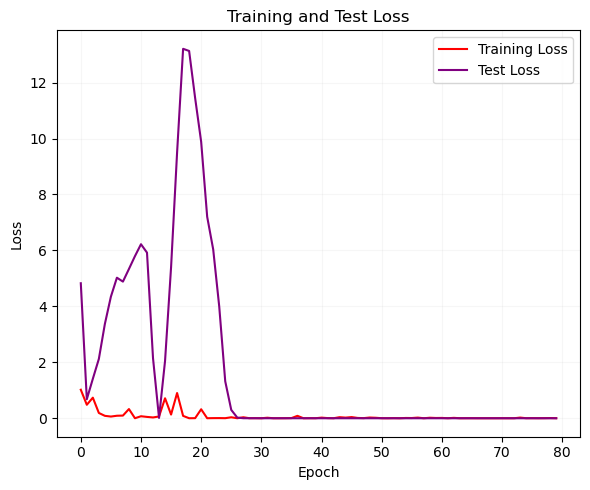

In [29]:
fig,ax=plt.subplots(1,1,figsize=(6,5))
#ax.scatter(x=list(range(40)),y=loss_list)
epochs=range(len(loss_list))
ax.plot(epochs,loss_list,c="red",label="Training Loss")
ax.plot(epochs,loss_list_test,c="purple",label="Test Loss")
ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.grid(True,alpha=0.1)
ax.set_title("Training and Test Loss")
ax.legend()
plt.tight_layout()
plt.show()

We can also examing see how the model's accuracy changes over time.  <br>In the plot below, the y-axis represents accuracy as a % and the x-axis represents the epoch number.  Ideally, accuracy should increase over time.  Both training and test accuracy curves indicate that ~40 epochs is enough to achieve maximum accuracy.  <b> Note</b>:  Achieving 100% accuracy is not feasible in most real-world task. 100% accuracy could suggest:
1) Overfitting, or 
2) Task is too simple

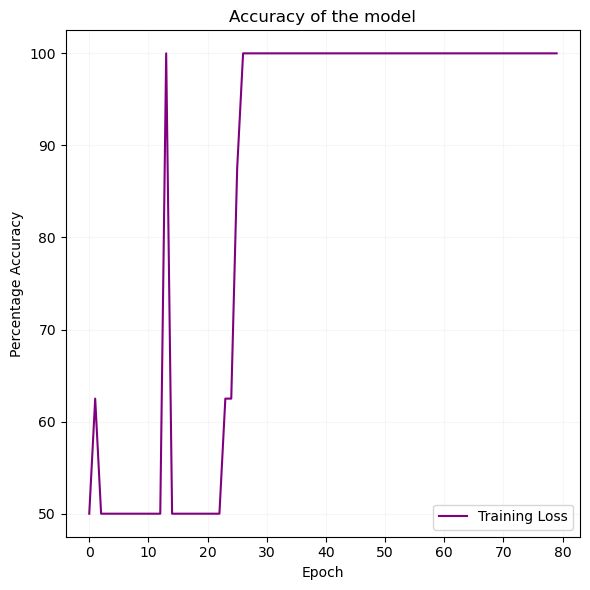

In [30]:
fig,ax=plt.subplots(1,1,figsize=(6,6))
#ax.scatter(x=list(range(40)),y=loss_list)
epoch=range(len(loss_list))
ax.plot(epoch,prediction_test,c="purple",label="Training Loss")
ax.legend()
ax.set_xlabel("Epoch")
ax.set_ylabel("Percentage Accuracy")
ax.grid(True,alpha=0.1)
ax.set_title("Accuracy of the model")
plt.tight_layout()
plt.show()

Next, let's use our trained model to perform inference on the full dataset.  Recall that our dataset consists of AD and Control groups.  Within AD, we have 3 subcategories based on age: Older( "A"),Middle-Aged("B"), and Younger ("C"). Each age category is associated with different levels of plaque. An interesting question is whether the final layer's output, or the probabilities of the sigmoid activation function will be able to distinguish this group.  Let's use the `full_data` dataloader object to predict on all samples and examine the model's output to find patterns.

In [31]:
model=custom_model()
model.load_state_dict(torch.load("/data/banskotan2/Projects/Deep_Learning/model.pth"))
model.to("cuda")
model.eval()
pred_list_full=[]
actual_list_full=[]
id_list_full=[]
Age_categ_list_full=[]
pred_class_full=[]
pred_probs_full_list=[]
with torch.no_grad():
    for batch in full_data:
        images_full=batch["image"].to(device)
        labels_full=batch["Condition"].to(device).view(-1)
        AGE_categ_full=batch["Age_Categ"]
        id_full=batch["id"]
        outputs_full=model(images_full)
        pred_list_full.extend(outputs_full.cpu().tolist())
        pred_tensor_full=outputs_full.clone().detach()
        pred_probs_full=torch.sigmoid(pred_tensor_full)
        pred_probs_full_list.extend(pred_probs_full.float().cpu().numpy().flatten())
        pred_class=(pred_probs_full>=0.5).int().cpu().numpy().flatten()
        pred_class_full.extend(pred_class)
        actual_list_full.extend(labels_full.tolist())
        Age_categ_list_full.extend(AGE_categ_full)
        id_list_full.extend(id_full.tolist())
final_df=pd.DataFrame({"prediction":pred_list_full,
                       "predicted_class":pred_class_full,
                       "probability":pred_probs_full_list,
                       "Actual":actual_list_full,
                       "Age_Categ":Age_categ_list_full,
                       "ID":id_list_full})

/tmp/ipykernel_2274134/3837083309.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/data/banskotan2/Projects/Deep_Learning/model.pth"))


Let's look at the shape.  This should have length of 25, since we have 25 samples total.

In [32]:
final_df.shape

(25, 6)

Let's look at the pandata `DataFrame` that we created.

In [33]:
final_df

,prediction,predicted_class,probability,Actual,Age_Categ,ID
0,[-11.246125221252441],0,0.000013,0,A,925762
1,[-13.152928352355957],0,0.000002,0,C,948357
2,[-11.190325736999512],0,0.000014,0,B,933598
3,[45.894351959228516],1,1.000000,1,B,933307
4,[-10.91750431060791],0,0.000018,0,A,925564
5,[-10.675019264221191],0,0.000023,0,A,925761
6,[54.19881820678711],1,1.000000,1,A,925249
7,[-10.963994979858398],0,0.000017,0,C,946139
8,[65.27220153808594],1,1.000000,1,B,933591
9,[56.94789505004883],1,1.000000,1,A,925248


One issue is that the control samples also tend to have these Age categories. Let's lump all "Control" samples as "Control" categories regardless of their age in weeks.

In [34]:
final_df.loc[final_df["Actual"]==0,"Age_Categ"]="Control"

Using the `Categorical()` method, we will re-order our categories.  C is the younger one and should be the closest to control.

In [35]:
final_df["Age_Categ"]=pd.Categorical(final_df["Age_Categ"],categories=["Control","C","B","A"])

Next, let's sort by the <b> Age Categ </b> variable.

In [36]:
final_df=final_df.sort_values("Age_Categ")

Let's simply create a scatter plot.  Potentially, you could also create a regression line, but there is a clear pattern here with possibly one outlier.

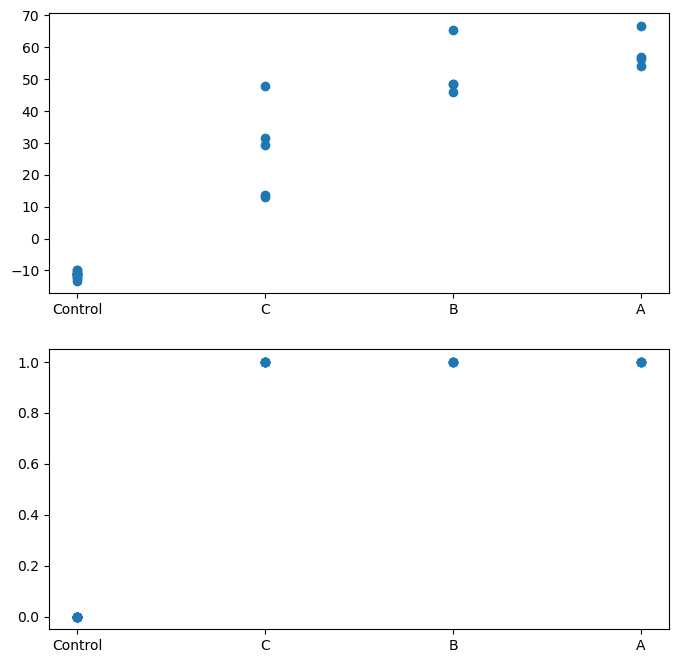

In [37]:
fig,ax=plt.subplots(2,1,figsize=(8,8))
ax[0].scatter(final_df["Age_Categ"].tolist(),final_df["prediction"].tolist())
ax[1].scatter(final_df["Age_Categ"].tolist(),final_df["probability"].tolist())
plt.show()

From the plots above, it appears that the activation of the last layer can separate Control, C, B and A quite well.  However the sigmoid function, which outputs probabilities are not showing a difference.  
A better approach would be to use a <b>softmax</b> function. For more than 2 categories, Binary Crossentropy will not work.

We can visualize the performance of a classification model  by using a <b> confusion matrix </b>.
A confusion matrix compared your predictions to the actual outcomes.

In a binary setting, a confusion matrix is structured as follows:

||Predicted Negative|Predicted Positive|
|------------------|------------------|--------------|
|Actual Negative|True Negative(TN)|False Positive(TP)|
|Actual Positive|False Negative (FN)|True Positive(TP)|

In a confusion matrix:
- True Negatives (TN) are located at row 0, column 0

- True Positives (TP) are at row 1, column 1

- False Positives (FP) are at row 0, column 1

- False Negatives (FN) are at row 1, column 0

In our specific example, all samples are predicted correctly. Therefore, the off-diagonal values (FP and FN) are zero.

<b>Accuracy </b> is the proportion of correctly predicted instances given by:
$$Accuracy=\frac{TP+TN}{TP+TN+FP+FN}$$

<b> Precision </b> Measures how many of the actual positive cases are actually positive.

$$Precision=\frac{TP}{TP+FP}$$
  
<b>Recall</b> measures how many of the actual positives are correct predictions.
$$Recall=\frac{TP}{TP+FN}$$

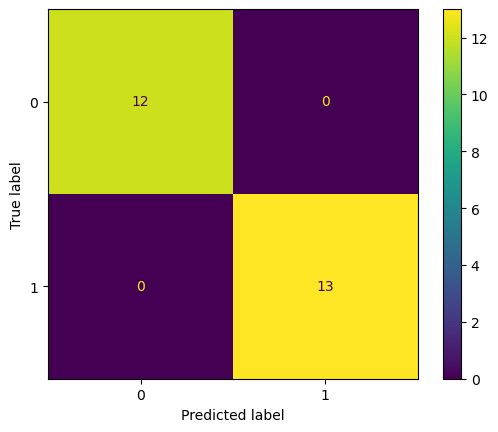

In [38]:
#mat=confusion_matrix(final_df["predicted_class"],final_df["Actual"])
ConfusionMatrixDisplay.from_predictions(final_df["Actual"],final_df["predicted_class"])
plt.show()

# <a id="Visualizing-Convolutional-Layers">Visualizing Convolutional Layers</a>

There are several ways to visualize what a CNN is doing.
- <b>Visualize</b> the <b>learned weights</b> of the CNN.
- <b>Visualize the <b>feature maps</b>, which are essentially the activation outputs of different layers.
- Use <b>interpretability tools</b> such as <b>GRAD-CAM</b> to generate heatmaps that highlight important regions.

GRAD-CAM can be downloaded below:
https://github.com/jacobgil/pytorch-grad-cam

Example heatmap:

<img src="https://db0dce98.rocketcdn.me/en/files/2021/07/Original-Image.jpg" width=500></img>

In this section, we will focus on visualizing weights and feature maps.

To remind us, first, let's look at the model.
What layer should be targeted for visualization purposed?

In [39]:
print(model)

custom_model(
  (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 256, kernel_size=(5, 5), stride=(1, 1))
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(256, 512, kernel_size=(5, 5), stride=(1, 1))
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=51200, out_features=30, bias=True)
  (fc2): Linear(in_features=30, out_features=10, bias=True)
  (fc3): Linear(in_features=10, out_features=1, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
)


From the model above, we can access the weights of a convolutional layer by referencing its name.
Let's visualize the first convolutional layer.  Convolutional layers deeper in the network tend to capture more abstract features, while earlier (shallower) layers often capture more low-level patterns such as edges or textures.

However, in this case, no distinct patterns are visible, possibly due to the simplicity of these images.

The following script can be used to visualize the weights.

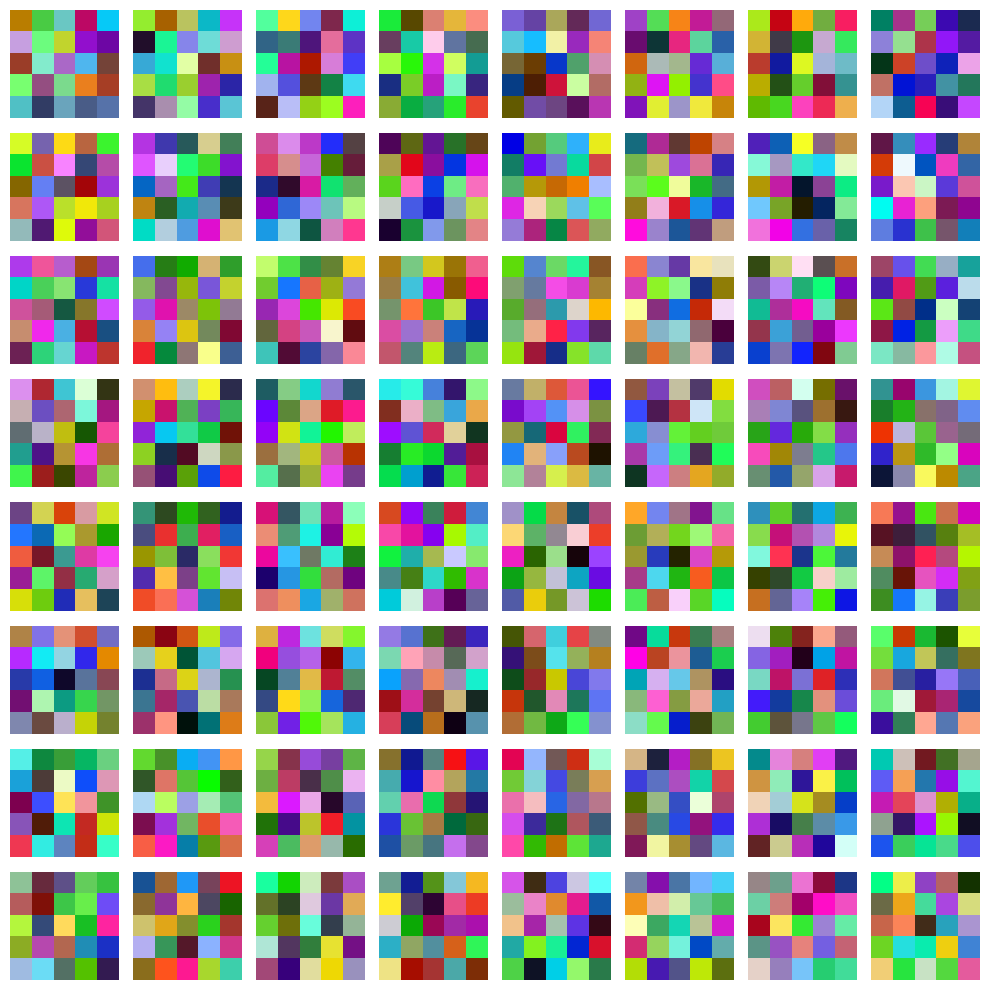

In [40]:
fig,ax=plt.subplots(8,8,figsize=(10,10))
conv_weight=model.conv1.weight.detach().cpu()
for i in range(64):
    row=i//8
    col=i%8
    weight_1=conv_weight[i]
    conv_for_plot=weight_1.permute(1,2,0)
    conv_normalized=(conv_for_plot-conv_for_plot.min())/(conv_for_plot.max()-conv_for_plot.min())
    ax[row,col].imshow(conv_normalized)
    ax[row,col].axis("off")
plt.tight_layout()
plt.show()

To visualize feature maps in a CNN, we need to <b>register forward hooks</b> of the layers of interest.
In the example below, we define a function that accepts a layer name and returns a hook function.  This hook capture the output during the forward pass and stores in a dictionary.
That layer name is then stored in a dictionary.
Using `register_forward_hook`, we attach this hook to `conv1` and `conv2`.

In [41]:
layer={}
def read_activation(name):
    def forward_hook_fn(model,input,output):
        layer[name]=output
    return forward_hook_fn
model.conv1.register_forward_hook(read_activation("conv1"))
model.conv2.register_forward_hook(read_activation("conv2"))

The script below performs a forward pass through the model.

We begin by  extracting a single image from the dataloader using `next(iter(training_dataload))`.
The model's output is not needed at this point, so we discard it using the `_` placeholder.

We will also visualize the image to get a sense of what the model is doing.

1
torch.Size([1, 3, 224, 224])


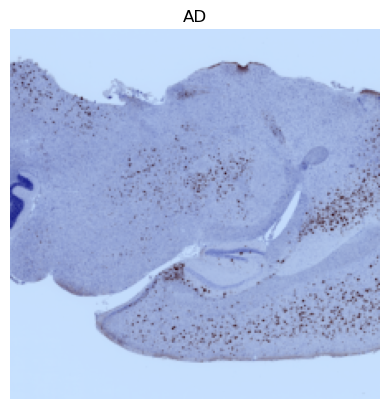

In [42]:
torch.manual_seed(2)
batch = next(iter(training_dataload))
single_image=batch["image"][0].unsqueeze(0)
print(batch["Condition"][0].item())
print(single_image.shape)
Condition_single_image="AD" if (batch["Condition"][0].item()) else "Control"
_=model(single_image.to("cuda"))
image_to_plot=single_image[0]
image_min_max=(image_to_plot-image_to_plot.min())/(image_to_plot.max()-image_to_plot.min())
image_min_max=image_min_max.permute(1,2,0).cpu().numpy()
plt.imshow(image_min_max)
plt.title(Condition_single_image)
plt.axis(False)
plt.show()

Since there are many feature maps, we will not be able to visualize all of them.  Instead, we will visualize 16 feature maps per convolutional layer for clarity.
The `conv1` layer produces <b> 64 feature maps</b>, corresponding to 64 filters applied during that convolution.

The `conv2` layer generates <b>128 feature maps</b>.

We will verify the shape using two print statements.

In [43]:
print(layer["conv1"].shape)
print(layer["conv2"].shape)

torch.Size([1, 64, 220, 220])
torch.Size([1, 128, 106, 106])


The script below loops through the first 16 feature maps from the `conv` layer and visualizes them using `matplotlib`.

The first dimension of the activation tensor corresponds to the batch. Thus, we use [0] to select the single image we passed through the model.

The [i] index selects the i-th feature map from the 64 available. We display them in a 4×4 grid.

Interestingly, some of the filters in the first convolutional layer appear to respond to plaque-like structures by generating localized "dot" activations in regions where plaques are expected. This suggests the network may be learning to highlight relevant pathology early in the architecture.

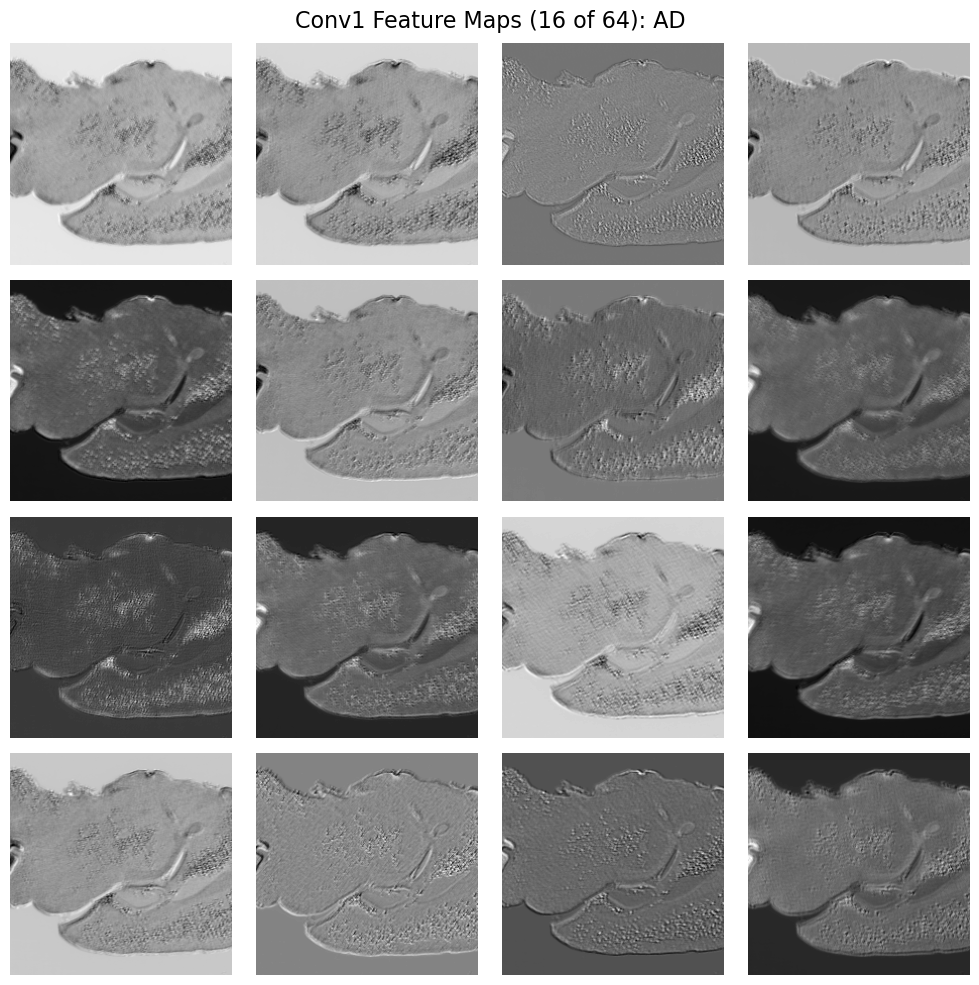

In [44]:
fig,ax=plt.subplots(4,4,figsize=(10,10))
fig.suptitle(f"Conv1 Feature Maps (16 of 64): {Condition_single_image}", fontsize=16)
for i in range(16):
    row=i//4
    col=i%4
    activation_to_plot=layer["conv1"][0][i]
    activation_to_plot=activation_to_plot.detach().cpu().numpy()
    ax[row,col].imshow(activation_to_plot,cmap="gray")
    ax[row,col].axis(False)
plt.tight_layout()
plt.show()

The script below is nearly identical to the previous one used for visualizing `conv` feature maps.

Ideally, the script should be encapsulated in a reusable function to avoid repetition.

This time, we visualize the first 16 feature maps from the conv2 layer, which contains a total of 128 feature maps.

Unlike the first layer,where some feature maps produced distinct "dot-like" activations corresponding to plaques,the conv2 feature maps appear more diffuse or "cloudy." Despite this softer appearance, they often exhibit strong black-and-white contrast, indicating that the layer is activating selectively in response to more abstract, higher-level features.

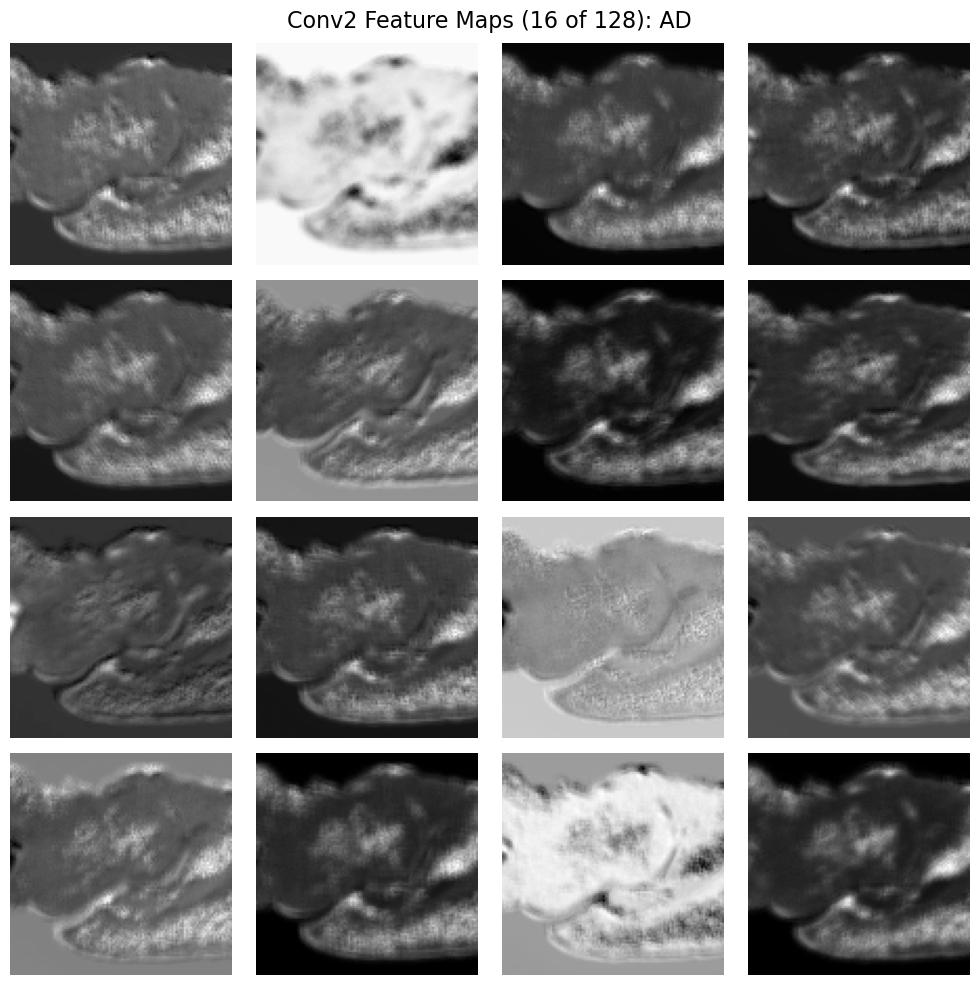

In [45]:
fig,ax=plt.subplots(4,4,figsize=(10,10))
fig.suptitle(f"Conv2 Feature Maps (16 of 128): {Condition_single_image}", fontsize=16)
for i in range(16):
    row=i//4
    col=i%4
    activation_to_plot=layer["conv2"][0][i]
    activation_to_plot=activation_to_plot.detach().cpu().numpy()
    ax[row,col].imshow(activation_to_plot,cmap="gray")
    ax[row,col].axis(False)
plt.tight_layout()
plt.show()

### <a id="Transfer-Learning-for-Multiple-Classes">Transfer Learning for Multiple Classes</a>

 We now shift focus to <b>transfer learning</b> for a <b>multi-class</b> classification task.  
 The goal is to predict age-related categories of mice based on image data.
 
 1) Control ice: Label `0`
 2) Youngest mice: Label `1`
 3) Mid-aged mice: Label `2`
 4) Oldest mice: Label `3`

The AD_Dataset2 class returns a dictionary containing:

- An image tensor (preprocessed and normalized), and

- A categorical label (label) representing the age/condition class.

The dataset structure and CSV format have been described earlier, so we will focus here on parsing logic and structure.

In [64]:
class AD_Dataset2(Dataset):
    def __init__(self,csv_file,transform=None):
        self.metadata=pd.read_csv(csv_file,index_col=0)
        self.transform=transform
    def __len__(self):
        return len(self.metadata)
    def __getitem__(self,idx):
        if torch.is_tensor(idx):
            idx=idx.tolist()
        image_name=self.metadata.iloc[idx,31]
        ID_name=self.metadata.iloc[idx,1]
        Condition_name=self.metadata.iloc[idx,17]
        Condition_int=0 if Condition_name=="-" else 1
        Age_Categ_name=self.metadata.iloc[idx,32]
        if Condition_int==0:
            Age_Categ_int=0
        elif Condition_int==1 and Age_Categ_name=="C":
            Age_Categ_int=1
        elif Condition_int==1 and Age_Categ_name=="B":
            Age_Categ_int=2
        elif Condition_int==1 and Age_Categ_name=="A":
            Age_Categ_int=3
        image_dat=io.read_image(image_name)
        image_dat=image_dat.type(torch.float32)/255.0
        if self.transform:
            image_dat= self.transform(image_dat)
        sample={"image":image_dat,
               "label":torch.tensor(Age_Categ_int,dtype=torch.long)}
        return sample

We define a transformation as previously described.

In [65]:
transformation2=v2.Compose([
    v2.Resize(256),
    v2.CenterCrop(224),
    v2.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

Instantiate a dataset utilizing the transformation.

In [66]:
ad_data_transformed2=AD_Dataset2("image_info.csv",transform=transformation)

Visualize the image as described previously.

In [67]:
def run_image2(data,l=5,w=5,sz=(18,10),dpi=200):
    total_images=len(data)
    fig,ax=plt.subplots(l,w,figsize=sz,dpi=dpi)
    for i,sample in enumerate(data):
        #print(i)
        if i>=l*w:
            break
        row=i//w
        col=i%w
        #print(image.shape)
        image=sample["image"].clone()
        image = (image-image.min()) / (image.max()-image.min() + 1e-6)
        image = image.permute(1, 2, 0).cpu().numpy()
        ax[row,col].imshow(image)
        cond=sample["label"]
        title_for_plot=str(cond.item())
        ax[row,col].set_title(title_for_plot)
    for i in range(total_images,l*w):
        row=i//w
        col=i%w
        ax[row,col].axis("off")
    plt.tight_layout()
    plt.show()

Use the function above to visualize.  

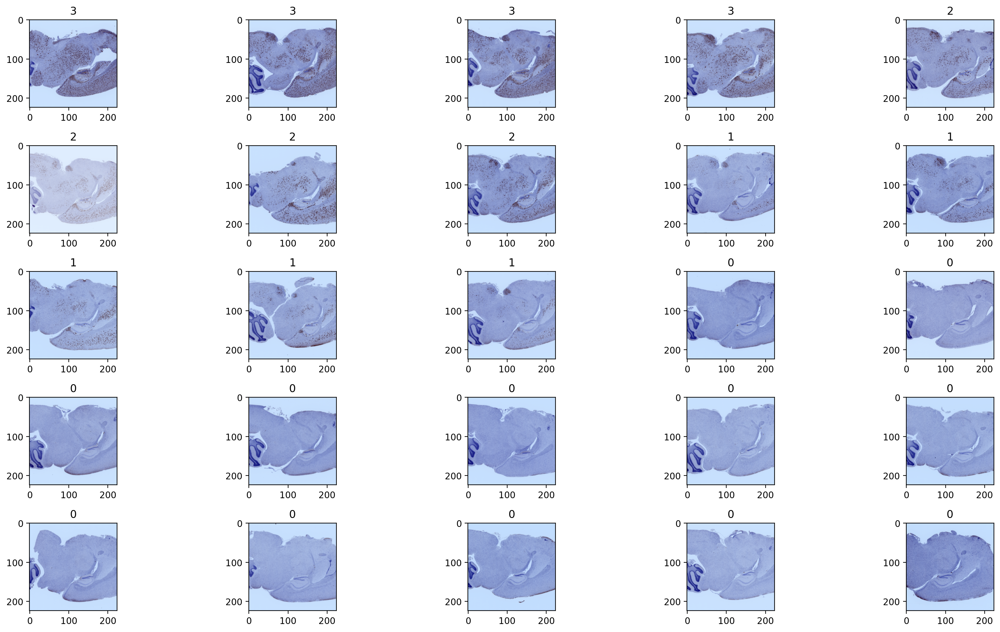

In [68]:
run_image2(ad_data_transformed2,l=5,w=5)

To a train-test splice, where training set has 17 samples, while the test set has 8 samples.

In [69]:
train_data2,test_data2=random_split(ad_data_transformed2,lengths=[17,8])
training_dataload2=DataLoader(train_data2,batch_size=8,shuffle=True)
test_dataload2=DataLoader(test_data2,batch_size=8,shuffle=True)

We will use the <b>ResNet-18</b> model, a widely used CNN architecture known for its strong performance and accuracy.  
This model was pretrained on the ImageNet dataset, which contains greater than 1 million images across 1,000 classes.
The primary innovation in ResNet architecture is the use of skip connections (or residual connections). These connections have proven to be highly influential.  They not only enabled the training of deeper CNNs by mitigating the vanishing gradient problem, but also inspiring modern architectures such as Transformers, which incorporate similar residual pathways.

Skip connections enable earlier-layer outputs to be added to later-layer inputs, helping prevent vanishing gradients and making it possible to train much deeper networks effectively.

We load the pretrained ResNet-18 model as follows:

In [70]:
model_resnet_v18=models.resnet18(weights="IMAGENET1K_V1")

In [71]:
print(model_resnet_v18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Let's visualize the first convolutional layer `(conv1)` of the ResNet-18 model.
Since this was trained on millions of diverse images from the ImageNet dataset, the learned filters in conv1 often exhibit visually distinct patterns—such as edge detectors or  color blobs. 

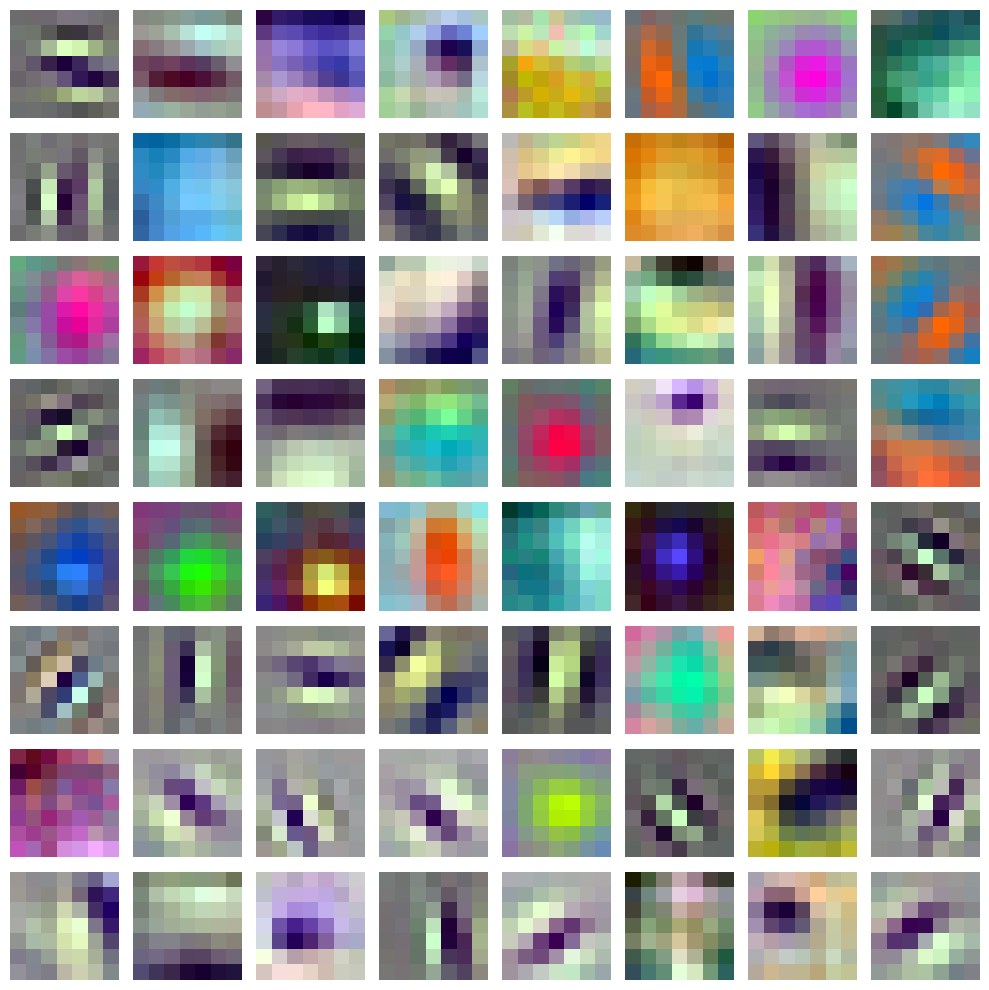

In [73]:
fig,ax=plt.subplots(8,8,figsize=(10,10))
resnet_weight=model_resnet_v18.conv1.weight.detach().cpu()
for i in range(64):
    row=i//8
    col=i%8
    weight_1=resnet_weight[i]
    conv_for_plot=weight_1.permute(1,2,0)
    conv_normalized=(conv_for_plot-conv_for_plot.min())/(conv_for_plot.max()-conv_for_plot.min())
    ax[row,col].imshow(conv_normalized)
    ax[row,col].axis("off")
plt.tight_layout()
plt.show()

We will <b>not be freezing</b> the parameters of the ResNet-18 model.
Freezing refers to disabling gradient updates for pretrained layers. This is often used in transfer learning to retain previously learned features. However, in our case, freezing the layers led to poor performance (results not shown). We thus opt to fine-tune the entire network instead.

This approach still benefits from the pretrained weights on ImageNet.

The final fully connected layer (fc) is replaced to match our 4-class output setup:
- Control
- Youngest AD
- Mid-aged AD
- Oldest AD
We use the <b>CrossEntropyLoss</b>, which is appropriate for <b>multi-class classification</b> tasks. Internally, it applies the softmax operation to convert raw logits into class probabilities.

We also apply the <b>StepLR scheduler</b>, which reduces the learning rate by a factor of 0.1 every 5 epochs. This helps with training stability and allows finer adjustments as the model converges.

The remaining commands (optimizer setup, device placement, etc.) follow standard practices already discussed.

In [74]:
for param in model_resnet_v18.parameters():
    param.requires_grad=True
model_resnet_v18.fc=nn.Linear(512,4)
model_resnet_v18=model_resnet_v18.to(device)
criterion2=nn.CrossEntropyLoss()
optim2=optim.Adam(model_resnet_v18.parameters(),lr=1e-3,weight_decay=1e-5)
exp_lr_scheduler = optim.lr_scheduler.StepLR(optim2, step_size=5, gamma=0.1)

The following scripts trains the model, as described previously.

In [75]:
loss_list=[]
loss_list_test=[]
prediction_test=[]
for epoch in tqdm(range(60)):  # loop over the dataset multiple times
    model_resnet_v18.train()
    running_loss = 0.0
    total_samples=0
    for batch in training_dataload2:
        images=batch["image"].to(device)
        labels=batch["label"].view(-1).long().to(device)
        optim2.zero_grad()
        outputs = model_resnet_v18(images)
        loss = criterion2(outputs, labels)
        loss.backward()
        optim2.step()
        running_loss += loss.item()*images.size(0)
        total_samples+=images.size(0)
    epoch_loss=running_loss/total_samples
    loss_list.append(epoch_loss)
    model_resnet_v18.eval()
    pred_list=[]
    actual_list=[]
    with torch.no_grad():
        test_running_loss=0.0
        total_samples_test=0
        for batch_test in test_dataload2:
            images_test=batch_test["image"].to(device)
            labels_test=batch_test["label"].to(device)
            outputs_test=model_resnet_v18(images_test)
            #preds=outputs_test
            _, preds = torch.max(outputs_test, 1)
            pred_list.extend(preds.cpu().tolist())
            actual_list.extend(labels_test.cpu().tolist())
            new_loss=criterion2(outputs_test,labels_test)
            test_running_loss+=new_loss.item()*images_test.size(0)
            total_samples_test+=images_test.size(0)
        total_loss_test=test_running_loss/total_samples_test
        exp_lr_scheduler.step()
        loss_list_test.append(total_loss_test)
        pred_tensor=torch.tensor(pred_list)
        actual_class=np.array(actual_list).astype(int).flatten()
        predictions_df=pd.DataFrame({"prediction":pred_list,"actual":actual_class})
        prediction=100*sum(predictions_df["prediction"]==predictions_df["actual"])/(predictions_df.shape[0])
        prediction_test.append(prediction)
    print(f"Epoch: {epoch+1:02d}, Training Loss:{epoch_loss:.4f},Test Loss: {total_loss_test:.4f},Test Set Prediction Accuracy:{prediction:.4f}%")

print('Finished Training')

  2%|▏         | 1/60 [00:30<30:12, 30.72s/it]

Epoch: 01, Training Loss:0.9981,Test Loss: 4.4907,Test Set Prediction Accuracy:37.5000%


  3%|▎         | 2/60 [01:01<29:39, 30.68s/it]

Epoch: 02, Training Loss:0.2920,Test Loss: 1.2062,Test Set Prediction Accuracy:62.5000%


  5%|▌         | 3/60 [01:31<29:04, 30.61s/it]

Epoch: 03, Training Loss:0.1185,Test Loss: 1.0355,Test Set Prediction Accuracy:50.0000%


  7%|▋         | 4/60 [02:02<28:31, 30.57s/it]

Epoch: 04, Training Loss:0.1904,Test Loss: 1.5295,Test Set Prediction Accuracy:62.5000%


  8%|▊         | 5/60 [02:33<28:01, 30.58s/it]

Epoch: 05, Training Loss:0.0434,Test Loss: 1.0667,Test Set Prediction Accuracy:75.0000%


 10%|█         | 6/60 [03:03<27:33, 30.62s/it]

Epoch: 06, Training Loss:0.2537,Test Loss: 1.2346,Test Set Prediction Accuracy:75.0000%


 12%|█▏        | 7/60 [03:34<27:05, 30.66s/it]

Epoch: 07, Training Loss:0.0313,Test Loss: 1.2182,Test Set Prediction Accuracy:75.0000%


 13%|█▎        | 8/60 [04:04<26:29, 30.56s/it]

Epoch: 08, Training Loss:0.2414,Test Loss: 1.2337,Test Set Prediction Accuracy:75.0000%


 15%|█▌        | 9/60 [04:35<26:00, 30.60s/it]

Epoch: 09, Training Loss:0.0374,Test Loss: 1.4872,Test Set Prediction Accuracy:75.0000%


 17%|█▋        | 10/60 [05:06<25:31, 30.63s/it]

Epoch: 10, Training Loss:0.4647,Test Loss: 0.7946,Test Set Prediction Accuracy:75.0000%


 18%|█▊        | 11/60 [05:36<24:55, 30.52s/it]

Epoch: 11, Training Loss:0.0227,Test Loss: 0.9728,Test Set Prediction Accuracy:75.0000%


 20%|██        | 12/60 [06:07<24:26, 30.54s/it]

Epoch: 12, Training Loss:0.4601,Test Loss: 0.5638,Test Set Prediction Accuracy:87.5000%


 22%|██▏       | 13/60 [06:37<23:59, 30.63s/it]

Epoch: 13, Training Loss:0.2075,Test Loss: 0.6429,Test Set Prediction Accuracy:87.5000%


 23%|██▎       | 14/60 [07:08<23:26, 30.57s/it]

Epoch: 14, Training Loss:0.4967,Test Loss: 0.6846,Test Set Prediction Accuracy:87.5000%


 25%|██▌       | 15/60 [07:38<22:54, 30.55s/it]

Epoch: 15, Training Loss:0.1179,Test Loss: 0.4682,Test Set Prediction Accuracy:87.5000%


 27%|██▋       | 16/60 [08:09<22:23, 30.52s/it]

Epoch: 16, Training Loss:0.2095,Test Loss: 0.5338,Test Set Prediction Accuracy:87.5000%


 28%|██▊       | 17/60 [08:39<21:54, 30.57s/it]

Epoch: 17, Training Loss:0.0181,Test Loss: 0.6215,Test Set Prediction Accuracy:87.5000%


 30%|███       | 18/60 [09:10<21:23, 30.55s/it]

Epoch: 18, Training Loss:0.2234,Test Loss: 0.7481,Test Set Prediction Accuracy:75.0000%


 32%|███▏      | 19/60 [09:41<20:54, 30.59s/it]

Epoch: 19, Training Loss:0.0492,Test Loss: 0.4913,Test Set Prediction Accuracy:87.5000%


 33%|███▎      | 20/60 [10:11<20:22, 30.57s/it]

Epoch: 20, Training Loss:0.0188,Test Loss: 0.5448,Test Set Prediction Accuracy:87.5000%


 35%|███▌      | 21/60 [10:42<19:50, 30.53s/it]

Epoch: 21, Training Loss:0.5233,Test Loss: 0.6813,Test Set Prediction Accuracy:75.0000%


 37%|███▋      | 22/60 [11:12<19:22, 30.58s/it]

Epoch: 22, Training Loss:0.0805,Test Loss: 0.4298,Test Set Prediction Accuracy:87.5000%


 38%|███▊      | 23/60 [11:43<18:50, 30.56s/it]

Epoch: 23, Training Loss:0.4919,Test Loss: 0.5067,Test Set Prediction Accuracy:87.5000%


 40%|████      | 24/60 [12:13<18:17, 30.49s/it]

Epoch: 24, Training Loss:0.0887,Test Loss: 0.3386,Test Set Prediction Accuracy:87.5000%


 42%|████▏     | 25/60 [12:44<17:49, 30.55s/it]

Epoch: 25, Training Loss:0.2721,Test Loss: 0.4577,Test Set Prediction Accuracy:87.5000%


 43%|████▎     | 26/60 [13:14<17:17, 30.51s/it]

Epoch: 26, Training Loss:0.0242,Test Loss: 0.5794,Test Set Prediction Accuracy:87.5000%


 45%|████▌     | 27/60 [13:45<16:44, 30.45s/it]

Epoch: 27, Training Loss:0.0201,Test Loss: 0.6672,Test Set Prediction Accuracy:87.5000%


 47%|████▋     | 28/60 [14:15<16:15, 30.49s/it]

Epoch: 28, Training Loss:0.0276,Test Loss: 0.7623,Test Set Prediction Accuracy:75.0000%


 48%|████▊     | 29/60 [14:46<15:47, 30.56s/it]

Epoch: 29, Training Loss:0.0258,Test Loss: 0.8681,Test Set Prediction Accuracy:75.0000%


 50%|█████     | 30/60 [15:16<15:14, 30.50s/it]

Epoch: 30, Training Loss:0.2104,Test Loss: 0.8690,Test Set Prediction Accuracy:75.0000%


 52%|█████▏    | 31/60 [15:47<14:42, 30.45s/it]

Epoch: 31, Training Loss:0.0664,Test Loss: 0.8309,Test Set Prediction Accuracy:75.0000%


 53%|█████▎    | 32/60 [16:17<14:11, 30.42s/it]

Epoch: 32, Training Loss:0.2287,Test Loss: 0.8379,Test Set Prediction Accuracy:75.0000%


 55%|█████▌    | 33/60 [16:47<13:42, 30.45s/it]

Epoch: 33, Training Loss:0.0199,Test Loss: 0.9104,Test Set Prediction Accuracy:75.0000%


 57%|█████▋    | 34/60 [17:18<13:10, 30.41s/it]

Epoch: 34, Training Loss:0.0393,Test Loss: 0.9270,Test Set Prediction Accuracy:75.0000%


 58%|█████▊    | 35/60 [17:48<12:42, 30.51s/it]

Epoch: 35, Training Loss:0.0208,Test Loss: 1.0893,Test Set Prediction Accuracy:75.0000%


 60%|██████    | 36/60 [18:19<12:14, 30.58s/it]

Epoch: 36, Training Loss:0.0432,Test Loss: 1.2010,Test Set Prediction Accuracy:75.0000%


 62%|██████▏   | 37/60 [18:50<11:43, 30.57s/it]

Epoch: 37, Training Loss:0.0179,Test Loss: 1.1842,Test Set Prediction Accuracy:75.0000%


 63%|██████▎   | 38/60 [19:20<11:11, 30.52s/it]

Epoch: 38, Training Loss:0.0208,Test Loss: 1.2042,Test Set Prediction Accuracy:75.0000%


 65%|██████▌   | 39/60 [19:50<10:39, 30.46s/it]

Epoch: 39, Training Loss:0.0225,Test Loss: 1.2970,Test Set Prediction Accuracy:75.0000%


 67%|██████▋   | 40/60 [20:21<10:10, 30.52s/it]

Epoch: 40, Training Loss:0.0613,Test Loss: 0.7422,Test Set Prediction Accuracy:75.0000%


 68%|██████▊   | 41/60 [20:52<09:40, 30.56s/it]

Epoch: 41, Training Loss:0.0640,Test Loss: 0.9334,Test Set Prediction Accuracy:75.0000%


 70%|███████   | 42/60 [21:22<09:10, 30.57s/it]

Epoch: 42, Training Loss:0.0232,Test Loss: 1.0432,Test Set Prediction Accuracy:75.0000%


 72%|███████▏  | 43/60 [21:53<08:41, 30.66s/it]

Epoch: 43, Training Loss:0.0485,Test Loss: 0.5348,Test Set Prediction Accuracy:87.5000%


 73%|███████▎  | 44/60 [22:24<08:11, 30.72s/it]

Epoch: 44, Training Loss:0.0339,Test Loss: 0.6102,Test Set Prediction Accuracy:87.5000%


 75%|███████▌  | 45/60 [22:55<07:40, 30.68s/it]

Epoch: 45, Training Loss:0.0319,Test Loss: 0.7098,Test Set Prediction Accuracy:75.0000%


 77%|███████▋  | 46/60 [23:25<07:09, 30.65s/it]

Epoch: 46, Training Loss:0.2140,Test Loss: 0.7220,Test Set Prediction Accuracy:75.0000%


 78%|███████▊  | 47/60 [23:56<06:37, 30.59s/it]

Epoch: 47, Training Loss:0.2141,Test Loss: 0.7479,Test Set Prediction Accuracy:75.0000%


 80%|████████  | 48/60 [24:26<06:06, 30.56s/it]

Epoch: 48, Training Loss:0.0777,Test Loss: 0.4910,Test Set Prediction Accuracy:87.5000%


 82%|████████▏ | 49/60 [24:57<05:36, 30.61s/it]

Epoch: 49, Training Loss:0.0661,Test Loss: 0.3584,Test Set Prediction Accuracy:87.5000%


 83%|████████▎ | 50/60 [25:27<05:05, 30.56s/it]

Epoch: 50, Training Loss:0.0604,Test Loss: 0.5404,Test Set Prediction Accuracy:87.5000%


 85%|████████▌ | 51/60 [25:58<04:34, 30.48s/it]

Epoch: 51, Training Loss:0.0224,Test Loss: 0.7123,Test Set Prediction Accuracy:75.0000%


 87%|████████▋ | 52/60 [26:28<04:03, 30.42s/it]

Epoch: 52, Training Loss:0.2215,Test Loss: 0.7736,Test Set Prediction Accuracy:75.0000%


 88%|████████▊ | 53/60 [26:58<03:33, 30.44s/it]

Epoch: 53, Training Loss:0.0240,Test Loss: 0.9102,Test Set Prediction Accuracy:75.0000%


 90%|█████████ | 54/60 [27:29<03:03, 30.52s/it]

Epoch: 54, Training Loss:0.2094,Test Loss: 0.9405,Test Set Prediction Accuracy:75.0000%


 92%|█████████▏| 55/60 [28:00<02:32, 30.54s/it]

Epoch: 55, Training Loss:0.0553,Test Loss: 0.6401,Test Set Prediction Accuracy:75.0000%


 93%|█████████▎| 56/60 [28:30<02:02, 30.58s/it]

Epoch: 56, Training Loss:0.2140,Test Loss: 0.6288,Test Set Prediction Accuracy:87.5000%


 95%|█████████▌| 57/60 [29:01<01:31, 30.58s/it]

Epoch: 57, Training Loss:0.2713,Test Loss: 0.7180,Test Set Prediction Accuracy:75.0000%


 97%|█████████▋| 58/60 [29:31<01:01, 30.53s/it]

Epoch: 58, Training Loss:0.2216,Test Loss: 0.7828,Test Set Prediction Accuracy:75.0000%


 98%|█████████▊| 59/60 [30:02<00:30, 30.55s/it]

Epoch: 59, Training Loss:0.0193,Test Loss: 0.8030,Test Set Prediction Accuracy:75.0000%


100%|██████████| 60/60 [30:33<00:00, 30.55s/it]

Epoch: 60, Training Loss:0.0479,Test Loss: 0.4669,Test Set Prediction Accuracy:87.5000%
Finished Training


The accuracy implies that 7 out of 8 samples were predicted correctly based on their Age and AD status, but 2 were not.

Let's analyze this a little bit deeper.  Let's create a data frame to quantify observations that were correctly and incorrectly predicted.

In [81]:
predictions_df["match"]=predictions_df["prediction"]==predictions_df["actual"]
predictions_df["match"]=predictions_df["match"].astype(int)

In [82]:
predictions_df

,prediction,actual,match
0,3,3,1
1,0,0,1
2,1,1,1
3,0,0,1
4,0,0,1
5,1,1,1
6,3,2,0
7,2,2,1


We are going to group by the actual (the four classes) and calculate accuracy per class.

In [83]:
def perc(df):
    return 100*df["match"].sum()/df["match"].shape[0]

predictions_df.groupby("actual").apply(perc).reset_index().rename({0:"percentage"},axis=1)

/tmp/ipykernel_2274134/2282377601.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  predictions_df.groupby("actual").apply(perc).reset_index().rename({0:"percentage"},axis=1)


,actual,percentage
0,0,100.0
1,1,100.0
2,2,50.0
3,3,100.0


Based on the above, group 2 (which is the mid-aged mice) were not all predicted correctly.

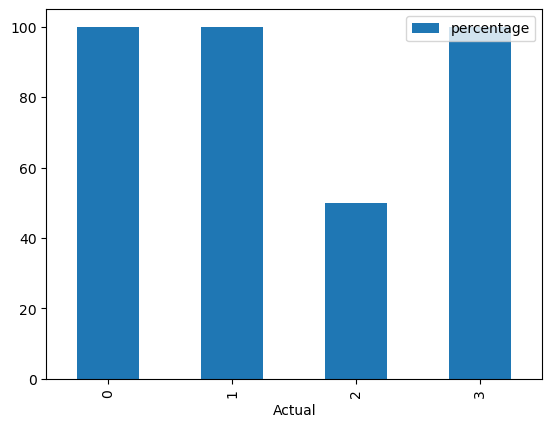

In [84]:
predictions_df.groupby("actual")[["actual","match"]].apply(perc).reset_index().rename({0:"percentage","actual":"Actual"},axis=1).plot.bar(x="Actual",y="percentage")
plt.show()

In [85]:
predictions_df

,prediction,actual,match
0,3,3,1
1,0,0,1
2,1,1,1
3,0,0,1
4,0,0,1
5,1,1,1
6,3,2,0
7,2,2,1


The prediction is reasonable, but potentially, we could do better.

We downsized the image, causing us to lose resolution.  Therefore, to get a better result, we need to use higher resolution, or use a different strategy.

The strategy classifies images based on their class, but does not give you information on plaque burden.

Two strategies that can be persued:

1)   <b>Patch-Based Classification from High-Resolution Images</b>

    - Retain the original higher resolution image (e.g. 10,000x10000), and divide into patches of 224x224 images.
        - Each patch will be independently classified:
        - If a patch contains a plaque, label as 1 for AD
        - If not, label as 0
        - The percentage of patches labeled as 1 gives an estimate of overall plaque burden. 
        - This patch-wise strategy can use ResNet or other CNN-based models.

2)   <b>Instance segmentation</b>

    -  Tain using an image mask.
    -  This requires a different algorithm (Unet+Watershet, or Mask-RCNN, etc).
    -  Not going to be discussed 